In [1]:
import os
import cv2
import mmcv
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from mmengine.config import Config
from mmengine.registry import init_default_scope
from mmdet.apis import inference_detector, init_detector
from mmrotate.visualization import RotLocalVisualizer

# Set the GPU to use
os.environ['CUDA_VISIBLE_DEVICES'] = '3'

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [2]:
# Configuration and checkpoint files
config_file = '../../configs/rhino/rhino_phc_haus-4scale_r50_2xb2-36e_brickkilns.py'
checkpoint_file = '../../work_dirs/rhino_phc_haus-4scale_r50_2xb2-36e_brickkilns1/epoch_36.pth'
test_image_dir = '../../data/brickkilns/test/images'
test_ann_dir = '../../data/brickkilns/test/annfiles'
out_dir = '../../results/utils'
METAINFO = {
	'classes': ('CFCBK', 'FCBK', 'Zigzag'),
	'palette': [(255, 0, 0), (0, 255, 0), (0, 0, 255)]
}

In [3]:
# Load the configuration file
cfg = Config.fromfile(config_file)
init_default_scope(cfg.get('default_scope', 'mmrotate'))

# Initialize the model
model = init_detector(cfg, checkpoint_file, device='cuda:0')

if not os.path.exists(out_dir):
    os.makedirs(out_dir)

# Initialize the visualizer
visualizer = RotLocalVisualizer()

Loads checkpoint by local backend from path: ../../work_dirs/rhino_phc_haus-4scale_r50_2xb2-36e_brickkilns1/epoch_36.pth


In [4]:
objects_list = ["CFCBK", "FCBK", "Zigzag"]
objects_list = pd.Series(objects_list)
objects_list

0     CFCBK
1      FCBK
2    Zigzag
dtype: object

In [5]:
image_files = os.listdir(test_image_dir)
image_files = sorted(image_files)[:5]
num_images = len(image_files)
print(num_images)
print(image_files)

5
['9295968_2901852.png', '9298719_2888094.png', '9298719_2904604.png', '9304223_2874335.png', '9304223_2877087.png']


In [6]:
def draw_annotations(image, ann_file):
	"""Draws rotated bounding boxes from a DOTA annotation file using specified colors."""
	img = image.copy()
	if not os.path.exists(ann_file):
		print(f"Annotation file {ann_file} not found.")
		return img
	class_to_color = dict(zip(METAINFO['classes'], METAINFO['palette']))
	with open(ann_file, 'r') as f:
		lines = f.readlines()
	for line in lines:
		values = line.strip().split()
		if len(values) < 9:
			continue
		points = np.array(list(map(float, values[:8]))).reshape((4, 2)).astype(int)
		label = values[8]
		color = class_to_color.get(label, (255, 255, 255))
		thickness = 1
		cv2.polylines(img, [points], isClosed=True, color=color, thickness=thickness)
		cv2.putText(img, label, (points[0][0], points[0][1] - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)
	return img


Processing image 1/5: 9295968_2901852.png
01/31 15:14:47 - mmengine - WARNING - "FileClient" will be deprecated in future. Please use io functions in https://mmengine.readthedocs.io/en/latest/api/fileio.html#file-io
01/31 15:14:47 - mmengine - WARNING - "HardDiskBackend" is the alias of "LocalBackend" and the former will be deprecated in future.


/home/shardul.junagade/my-work/domain-adaptation-brick-kilns/RHINO/.venv/lib/python3.8/site-packages/torch/_tensor.py:575: UserWarning: floor_divide is deprecated, and will be removed in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values.
To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor'). (Triggered internally at  ../aten/src/ATen/native/BinaryOps.cpp:467.)
  return torch.floor_divide(self, other)


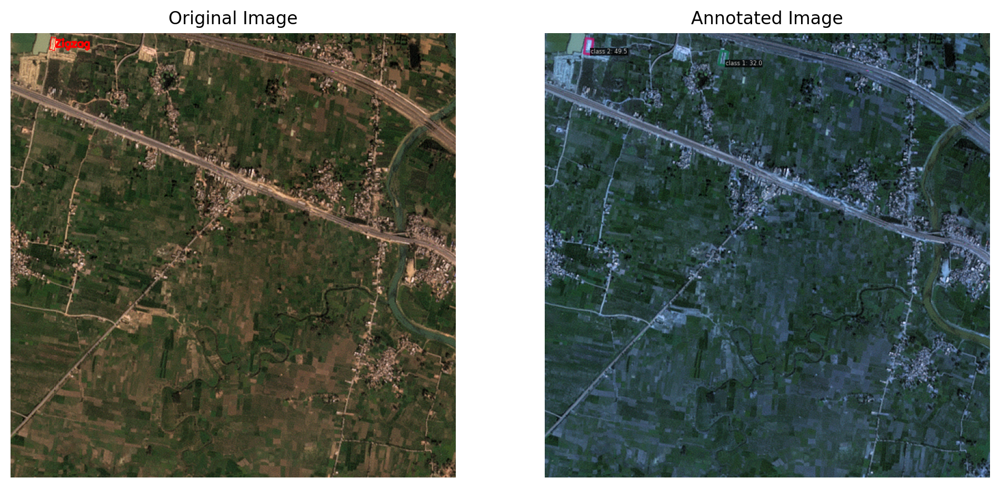

Processing image 2/5: 9298719_2888094.png


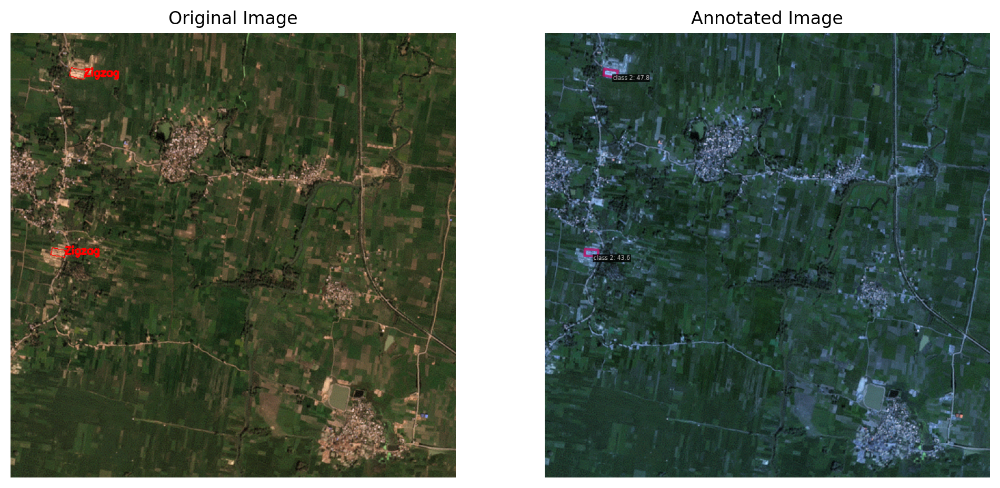

Processing image 3/5: 9298719_2904604.png


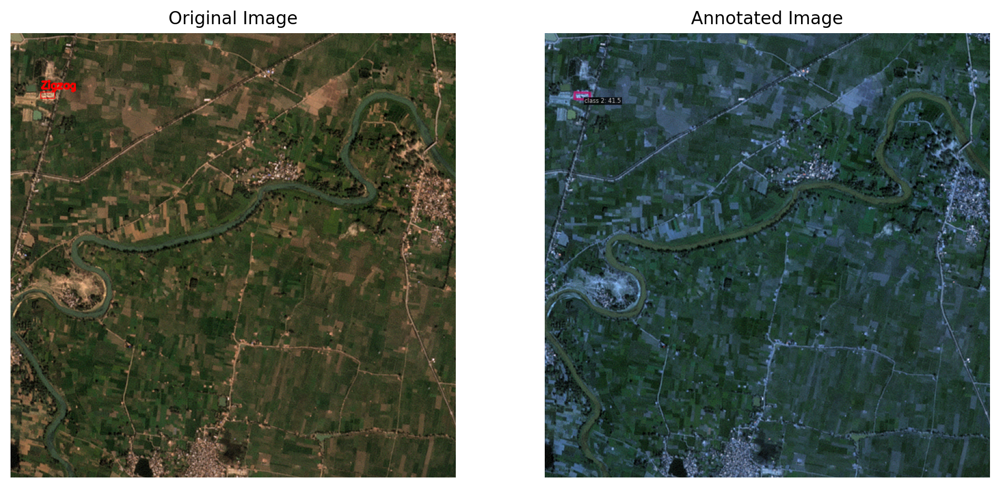

Processing image 4/5: 9304223_2874335.png


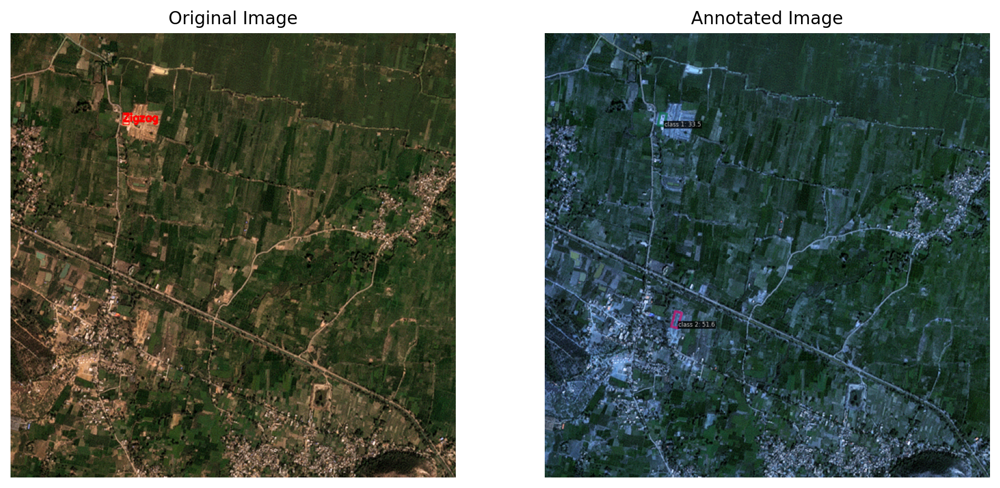

Processing image 5/5: 9304223_2877087.png


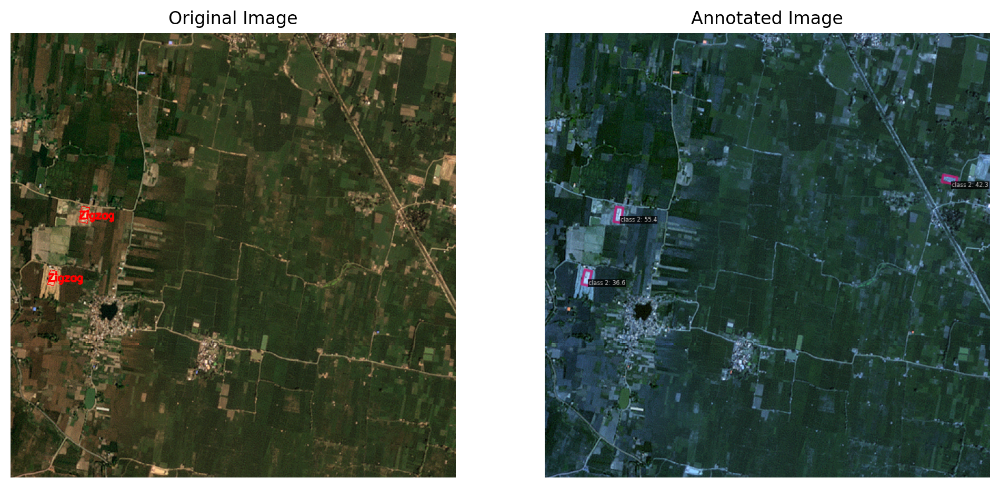

0

In [7]:
for i, image_name in enumerate(image_files):
    print(f"Processing image {i+1}/{num_images}: {image_name}")

    image_path = os.path.join(test_image_dir, image_name)
    ann_file = os.path.join(test_ann_dir, image_name.replace('.png', '.txt'))
    
    # Perform inference
    result = inference_detector(model, image_path)    
    output_path = os.path.join(out_dir, image_name)
    visualizer.add_datasample(
        image_name,
        mmcv.imread(image_path),
        result,
        show=False,
        draw_gt = False,
        out_file=output_path
    )

    # Load both images
    img_original = mmcv.imread(image_path)
    img_original_annotated = draw_annotations(img_original, ann_file)
    img_annotated = mmcv.imread(output_path)

    plt.figure(figsize=(12, 6))
    # Original Image with Annotations
    plt.subplot(1, 2, 1)
    plt.imshow(mmcv.bgr2rgb(img_original_annotated))
    plt.axis("off")
    plt.title("Original Image")
    # Annotated Image
    plt.subplot(1, 2, 2)
    plt.imshow(mmcv.bgr2rgb(img_annotated))
    plt.axis("off")
    plt.title("Annotated Image")
    plt.show()

# delete the out_dir
os.system(f'rm -rf {out_dir}')